# Выводы по проведенному сравнению алгоритмов non-blind deconvolution и нейросетевых моделей.

### Код для подключения к БД и визуализаций

In [1]:
%load_ext sql

In [2]:
%sql sqlite:////home/chaganovaob/edu/non-blind-deconvolution-benchmark/results/metrics.db

'Connected: @/home/chaganovaob/edu/non-blind-deconvolution-benchmark/results/metrics.db'

In [3]:
import warnings
warnings.filterwarnings('ignore', category=UserWarning)

In [77]:
import sys
sys.path.append('../src')

import typing as tp
from copy import copy

import numpy as np
import matplotlib.pyplot as plt
from omegaconf import OmegaConf

from imutils import imread, rgb2gray, gray2gray3d, make_noised, center_crop, load_npy, imshow, imsshow
from data.convolution import convolve
from data.convertation import float2linrgb16bit, linrrgb2srgb8bit
from deconv.classic.wiener.wiener import wiener_gray
from deconv.neural.usrnet.predictor import USRNetPredictor
from deconv.neural.dwdn.predictor import DWDNPredictor
from deconv.neural.kerunc.predictor import KerUncPredictor
from metrics import psnr, ssim

plt.gray()

np.random.seed(8)


def get_image_psf(
    image_path: str,
    psf_path: str,
    is_noised: bool,
) -> tp.Tuple[np.array, np.array, np.array, np.array]:
    
    image = imread(image_path)
    image = center_crop(image, 256, 256)
    if image.ndim == 3:
        image = rgb2gray(image)         

    psf = np.load(psf_path, allow_pickle=True).item()['psf']

    mu = 0
    sigma = 0.01

    # blurred
    blurred = convolve(image, psf)
    blurred_3d = gray2gray3d(blurred)

    if is_noised:
        blurred = make_noised(blurred, mu=mu, sigma=sigma)
        blurred_3d = make_noised(blurred_3d, mu=mu, sigma=sigma)

    return image, psf, blurred, blurred_3d

#############

def viz_split_discretization(
    image: np.array,
    psf: np.array,
    blurred: np.array,
    blurred_3d: np.array,
    models: dict,
    is_noised: bool,
    dicretization_types: tp.List[tp.Literal['float', 'linrgb_16bit', 'srgb_8bit']]
):
    num_rows = 3 if len(models) < 3 else (len(models))
    _, ax = plt.subplots(1 + len(dicretization_types), num_rows, figsize=(num_rows * 4, (1 + len(dicretization_types)) * 4))

    ax[0, 0].imshow(psf)
    ax[0, 0].axis('off')
    ax[0, 0].set_title('PSF')

    ax[0, 1].imshow(blurred)
    ax[0, 1].axis('off')
    ax[0, 1].set_title('Blurred')

    ax[0, 2].imshow(image)
    ax[0, 2].axis('off')
    ax[0, 2].set_title(f'Ground truth | ssim: {ssim(image, blurred):.2f}, psnr: {psnr(image, blurred):.2f} (image <-> blurred)')

    if len(models) == 4:
        ax[0, 3].imshow(np.zeros((5, 5), dtype=np.float16), cmap='binary', vmin=0, vmax=1)
        ax[0, 3].axis('off')

    noise = 'noise' if is_noised else 'no_noise'

    inds = [1 + i for i in range(len(dicretization_types))]

    if 'float' in dicretization_types:
        for i, model in enumerate(models.keys()):
            restored = (
                models[model][noise](blurred_3d, psf)[..., 0]
                if model in ['usrnet', 'dwdn']
                else models[model][noise](blurred, psf)
            )

            ax[inds[0], i].imshow(restored)
            ax[inds[0], i].axis('off')
            ax[inds[0], i].set_title(f'{model} | ssim: {ssim(image, restored):.2f}, psnr: {psnr(image, restored):.2f}')
        inds.pop(0)

    image = float2linrgb16bit(image)
    blurred = float2linrgb16bit(blurred)
    blurred_3d = float2linrgb16bit(blurred_3d)
    max_pixel = 2 ** 16 - 1

    if 'linrgb_16bit' in dicretization_types:
        for i, model_name in enumerate(models.keys()):
            model = models[model_name][noise] if model_name != 'wiener' else models[model_name]['noise']
            restored = (
               model((blurred_3d / max_pixel).astype(np.float32), psf)[..., 0]
                if model_name in ['usrnet', 'dwdn']
                else model((blurred / max_pixel).astype(np.float32), psf)
            )
            ax[inds[0], i].imshow(restored)
            ax[inds[0], i].axis('off')
            ax[inds[0], i].set_title(f'{model_name} | ssim: {ssim((image / max_pixel).astype(np.float32), restored):.2f}, psnr: {psnr((image / max_pixel).astype(np.float32), restored):.2f}')
        inds.pop(0)

    image = linrrgb2srgb8bit(image)
    blurred = linrrgb2srgb8bit(blurred)
    blurred_3d = linrrgb2srgb8bit(blurred_3d)
    max_pixel = 2 ** 8 - 1

    if 'srgb_8bit' in dicretization_types:
        for i, model_name in enumerate(models.keys()):
            model = models[model_name][noise] if model_name != 'wiener' else models[model_name]['noise']
            restored = (
               model((blurred_3d / max_pixel).astype(np.float32), psf)[..., 0]
                if model_name in ['usrnet', 'dwdn']
                else model((blurred / max_pixel).astype(np.float32), psf)
            )
            ax[inds[0], i].imshow(restored)
            ax[inds[0], i].axis('off')
            ax[inds[0], i].set_title(f'{model_name} | ssim: {ssim((image / max_pixel).astype(np.float32), restored):.2f}, psnr: {psnr((image / max_pixel).astype(np.float32), restored):.2f}')


###################


def viz_split_noise(
    image: np.array,
    psf: np.array,
    blurred: np.array,
    noised_blurred: np.array,
    blurred_3d: np.array,
    noised_blurred_3d: np.array,
    models: dict,
    discretization: tp.Literal['float', 'linrgb_16bit', 'srgb_8bit'],
):
    num_cols = 3 if len(models) < 3 else (len(models))
    _, ax = plt.subplots(3, num_cols, figsize=(num_cols * 4, 3 * 4))

    ax[0, 0].imshow(psf)
    ax[0, 0].axis('off')
    ax[0, 0].set_title('PSF')

    ax[0, 1].imshow(blurred)
    ax[0, 1].axis('off')
    ax[0, 1].set_title('Blurred')

    ax[0, 2].imshow(image)
    ax[0, 2].axis('off')
    ax[0, 2].set_title(f'Ground truth | ssim: {ssim(image, blurred):.2f}, psnr: {psnr(image, blurred):.2f} (image <-> blurred)')

    if len(models) == 4:
        ax[0, 3].imshow(np.zeros((5, 5), dtype=np.float16), cmap='binary', vmin=0, vmax=1)
        ax[0, 3].axis('off')
    
    max_pixel = 1

    if discretization in ['linrgb_16bit', 'srgb_8bit']:
        image = float2linrgb16bit(image)
        blurred = float2linrgb16bit(blurred)
        blurred_3d = float2linrgb16bit(blurred_3d)
        max_pixel = 2 ** 16 - 1

        if discretization == 'srgb_8bit':
            image = linrrgb2srgb8bit(image)
            blurred = linrrgb2srgb8bit(blurred)
            blurred_3d = linrrgb2srgb8bit(blurred_3d)
            max_pixel = 2 ** 8 - 1
    
    for i, model in enumerate(models.keys()):
        restored = (
            models[model]['no_noise']((blurred_3d / max_pixel).astype(np.float32), psf)[..., 0]
            if model in ['usrnet', 'dwdn']
            else models[model]['no_noise']((blurred / max_pixel).astype(np.float32), psf)
        )
        ax[1, i].imshow(restored)
        ax[1, i].axis('off')
        ax[1, i].set_title(f'{model} | ssim: {ssim(image / max_pixel, restored):.2f}, psnr: {psnr(image / max_pixel, restored):.2f}')

        restored = (
            models[model]['noise']((noised_blurred_3d / max_pixel).astype(np.float32), psf)[..., 0]
            if model in ['usrnet', 'dwdn']
            else models[model]['noise']((noised_blurred / max_pixel).astype(np.float32), psf)
        )
        ax[2, i].imshow(restored)
        ax[2, i].axis('off')
        ax[2, i].set_title(f'{model} | ssim: {ssim(image / max_pixel, restored):.2f}, psnr: {psnr(image / max_pixel, restored):.2f}')

###########################################

def viz_wiener_diff_params(
    image: np.array,
    psf: np.array,
    blurred: np.array,
    params: tp.List[dict],
):
    num_cols = 3 + len(params)
    _, ax = plt.subplots(1, num_cols, figsize=(num_cols * 6, 8))

    ax[0].imshow(psf)
    ax[0].axis('off')
    ax[0].set_title('PSF')

    ax[1].imshow(blurred)
    ax[1].axis('off')
    ax[1].set_title('Blurred')

    ax[2].imshow(image)
    ax[2].axis('off')
    ax[2].set_title(f'Ground truth | ssim: {ssim(image, blurred):.2f}, psnr: {psnr(image, blurred):.2f} (image <-> blurred)')
    
    for i, param in enumerate(params): 
        restored = wiener_gray(blurred, psf, **param, clip=True)
        ax[i + 3].imshow(restored)
        ax[i + 3].axis('off')
        ax[i + 3].set_title(f'{param} | ssim: {ssim(image, restored):.2f}, psnr: {psnr(image, restored):.2f}')
    

<Figure size 640x480 with 0 Axes>

In [5]:
config = OmegaConf.load('../configs/config_viz.yml')
cm = config.models
cd = config.dataset

models = dict()

models['wiener'] = dict()
models['wiener']['noise'] = lambda image, psf: wiener_gray(image, psf, **cm.wiener_nonblind_noise.noise_params)
models['wiener']['no_noise'] = lambda image, psf: wiener_gray(image, psf, **cm.wiener_nonblind_noise.no_noise_params)

models['kerunc'] = dict()
models['kerunc']['noise'] = KerUncPredictor(**cm.kerunc.noise_params)
models['kerunc']['no_noise'] = KerUncPredictor(**cm.kerunc.no_noise_params)

models['usrnet'] = dict()
models['usrnet']['noise'] = USRNetPredictor(model_path=cm.usrnet.model_path, **cm.usrnet.noise_params)
models['usrnet']['no_noise'] = USRNetPredictor(model_path=cm.usrnet.model_path, **cm.usrnet.no_noise_params)

models['dwdn'] = dict()
models['dwdn']['noise'] = DWDNPredictor(model_path=cm.dwdn.model_path, **cm.dwdn.noise_params)
models['dwdn']['no_noise'] = DWDNPredictor(model_path=cm.dwdn.model_path, **cm.dwdn.no_noise_params)

nn_models = copy(models)
nn_models.pop('wiener', None)

{'noise': <function __main__.<lambda>(image, psf)>,
 'no_noise': <function __main__.<lambda>(image, psf)>}

In [6]:
for key in config['models'].keys():
    print(key)
    print(config['models'][key])
    print()

wiener_blind_noise
{'gauss_blur': True, 'motion_blur': True, 'eye_blur': True, 'RGB': True, 'no_noise_params': {'balance': 0.001, 'clip': True}, 'noise_params': {'balance': 0.001, 'clip': True}}

wiener_nonblind_noise
{'gauss_blur': True, 'motion_blur': True, 'eye_blur': True, 'RGB': True, 'no_noise_params': {'balance': 1e-08, 'clip': True}, 'noise_params': {'balance': 0.005, 'clip': True}}

usrnet
{'gauss_blur': True, 'motion_blur': True, 'eye_blur': True, 'RGB': True, 'model_path': '../models/usrnet.pth', 'no_noise_params': {'scale_factor': 1, 'noise_level': 0, 'device': 'cpu'}, 'noise_params': {'scale_factor': 1, 'noise_level': 1, 'device': 'cpu'}}

dwdn
{'gauss_blur': True, 'motion_blur': True, 'eye_blur': True, 'RGB': True, 'model_path': '../models/model_DWDN.pt', 'no_noise_params': {'n_levels': 2, 'scale': 0.5, 'device': 'cpu'}, 'noise_params': {'n_levels': 2, 'scale': 0.5, 'device': 'cpu'}}

kerunc
{'gauss_blur': True, 'motion_blur': True, 'eye_blur': True, 'RGB': False, 'no_noi

### №0 Скорость инференса

Винеровский фильтр выигрывает по простоте использования ("из коробки") и скорости работы на процессоре. Нейросети намного более медленные на процессоре (*но стоит учитывать, что используются только torch-веса, без конвертации в другие форматы и/или оптимизации*), но сопоставимые по скорости на видеокартах. При этом нейросети требуют обучения.

In [1]:
## timeit для алгоритмов на CPU

In [ ]:
## timeit для алгоритмов на GPU

## №1 Нейросетевые методы в целом показывают лучшее качество

Disclaimer: Сравнение проводилось по одному общему для всех моделей типу размытия: **motion blur**.

- Винеровский фильтр выигрывает в единственном случае: на float-изображениях без шума (идеальный вариант). При этом отрыв только по метрикам, визуально качество восстановленных изображений не имеет заметных отличий. 

- В реалистичных условиях (с шумом и другим типом дискретизации) нейросети и по метрикам, и визуально лучше Винеровского фильтра, который допускает появление кольцевых артефактов (**почему?**).

- Важно, что гиперпараметры Винеровского фильтра (`balance`) были оптимизированы под различные типы дискретизации, в то время как гипермараметры нейросетей -- нет.

### 1. Float без шума

In [2]:
## sql запрос и табличка

In [ ]:
## код для 1 утверждения: картинки

### 2. Реалистичные условия (шум, другие типы дискретизации)

In [ ]:
## sql запрос и табличка

In [ ]:
## код для 1 утверждения: картинки

##  [+] №3 Нейросети не работают на тех видах размытиях, на которых не были обучены

- **DWDN**, **KerUnc**: обучены на motion blur <-> незнакомые виды размытия: gauss blur, eye blur

- **USRNet**: обучена на motion blur, gauss blur <-> незнакомый вид размытия: eye blur

**Вывод**: в процесс обучения нейросетевые модели приобретают обобщающую способность по отношению к незнакомым ядрам в пределах одного типа размытия, но настраиваются под конкретный тип размытия.

#### Метрики

- Упрощенный запрос: смотрим только float дискретизацию без шума (как наиболее простой случай)


In [15]:
%%sql sqlite://

SELECT model, blur_type, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_21_03_final 
WHERE model IN ('dwdn', 'kerunc', 'usrnet') AND blur_type IN ('eye_blur', 'gauss_blur') AND discretization == 'float' AND noised == False
GROUP BY model, blur_type;

Done.


model,blur_type,AVG(psnr),AVG(ssim)
dwdn,eye_blur,18.68,0.7
dwdn,gauss_blur,22.92,0.8
kerunc,eye_blur,20.71,0.71
kerunc,gauss_blur,23.59,0.81
usrnet,eye_blur,30.71,0.93
usrnet,gauss_blur,28.2,0.91


USRNet справилась с eye_blur даже лучше, чем с gauss_blur (**почему?**)

- Детализированный запрос по видам дискретизации и шуму

In [ ]:
%%sql sqlite://

SELECT model, blur_type, discretization, noised, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_21_03_final 
WHERE model IN ('dwdn', 'kerunc', 'usrnet') AND blur_type IN ('eye_blur', 'gauss_blur') 
GROUP BY model, blur_type, discretization, noised;


Done.


model,blur_type,discretization,noised,AVG(psnr),AVG(ssim)
dwdn,eye_blur,float,0,18.68,0.7
dwdn,eye_blur,float,1,18.5,0.68
dwdn,eye_blur,linrgb_16bit,0,17.31,0.65
dwdn,eye_blur,linrgb_16bit,1,16.1,0.61
dwdn,eye_blur,srgb_8bit,0,19.94,0.69
dwdn,eye_blur,srgb_8bit,1,19.6,0.68
dwdn,gauss_blur,float,0,22.92,0.8
dwdn,gauss_blur,float,1,22.78,0.8
dwdn,gauss_blur,linrgb_16bit,0,20.7,0.79
dwdn,gauss_blur,linrgb_16bit,1,18.0,0.7


#### Иллюстрации

Eye blur: big without noise

/home/chaganovaob/anaconda3/envs/deconv-venv-old-torch/lib/python3.9/site-packages/torch/nn/functional.py:3060: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


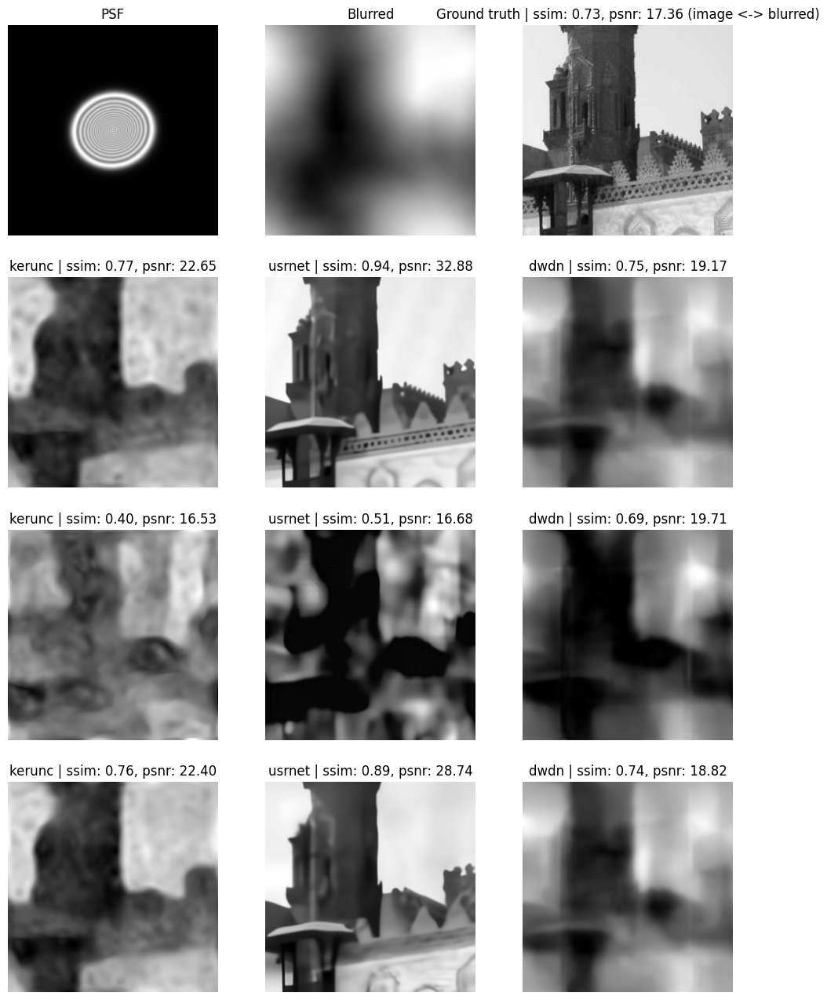

In [62]:
IS_NOISED = False

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/big-psf-0.npy',
    is_noised=IS_NOISED,
)

viz_split_discretization(image, psf, blurred, blurred_3d, nn_models, is_noised=IS_NOISED, dicretization_types=['float', 'linrgb_16bit', 'srgb_8bit'])

Eye blur: small without noise

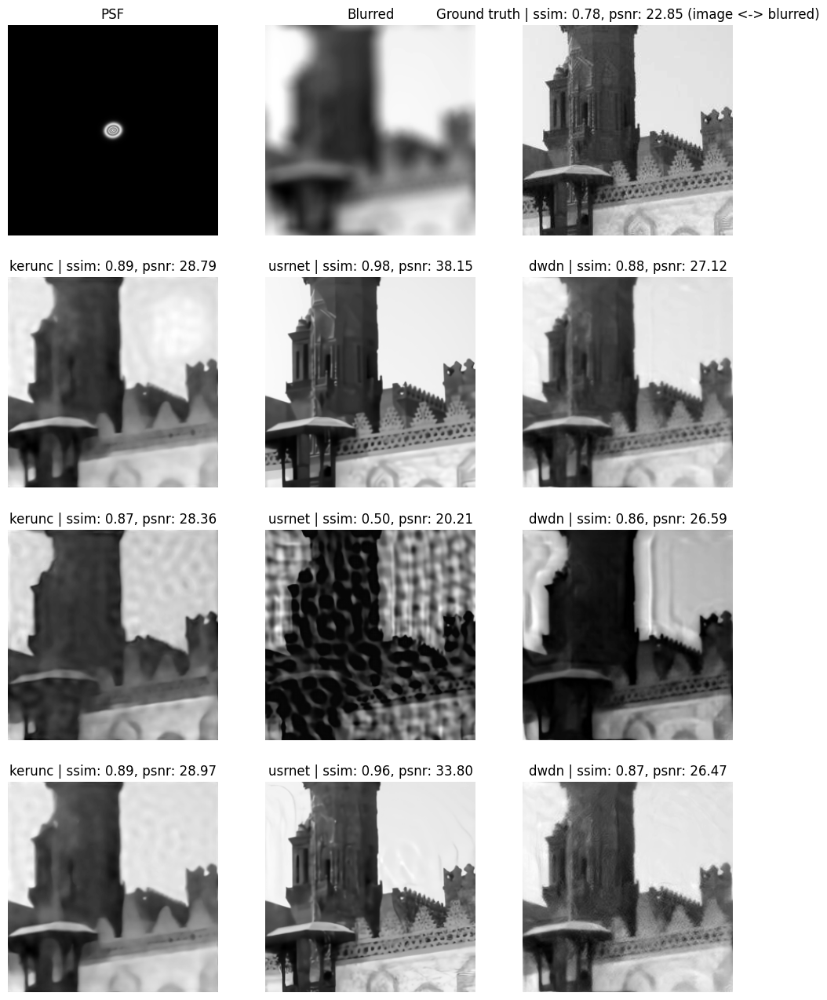

In [63]:
IS_NOISED = False

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/small-psf-0.npy',
    is_noised=IS_NOISED,
)

viz_split_discretization(image, psf, blurred, blurred_3d, nn_models, is_noised=IS_NOISED, dicretization_types=['float', 'linrgb_16bit', 'srgb_8bit'])

With noise:

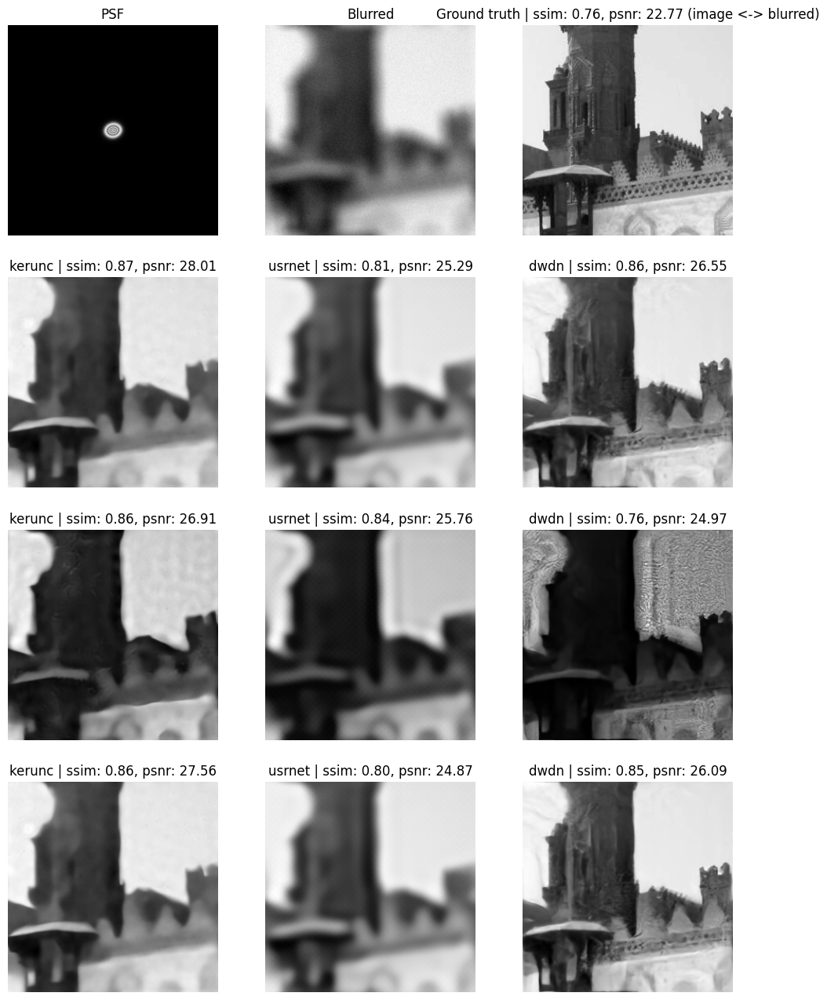

In [65]:
IS_NOISED = True

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/small-psf-0.npy',
    is_noised=IS_NOISED,
)

viz_split_discretization(image, psf, blurred, blurred_3d, nn_models, is_noised=IS_NOISED, dicretization_types=['float', 'linrgb_16bit', 'srgb_8bit'])

Gauss blur: no noise

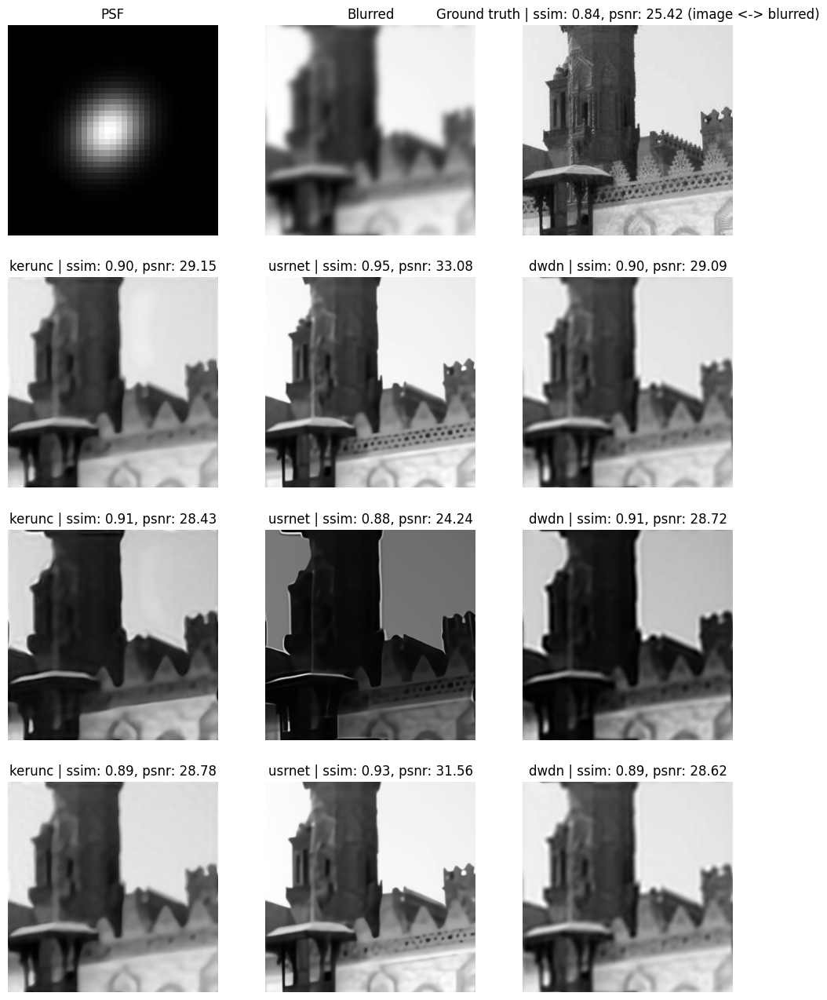

In [68]:
IS_NOISED = False

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-0.npy',
    is_noised=IS_NOISED,
)

viz_split_discretization(image, psf, blurred, blurred_3d, nn_models, is_noised=IS_NOISED, dicretization_types=['float', 'linrgb_16bit', 'srgb_8bit'])

Gauss blur: with noise

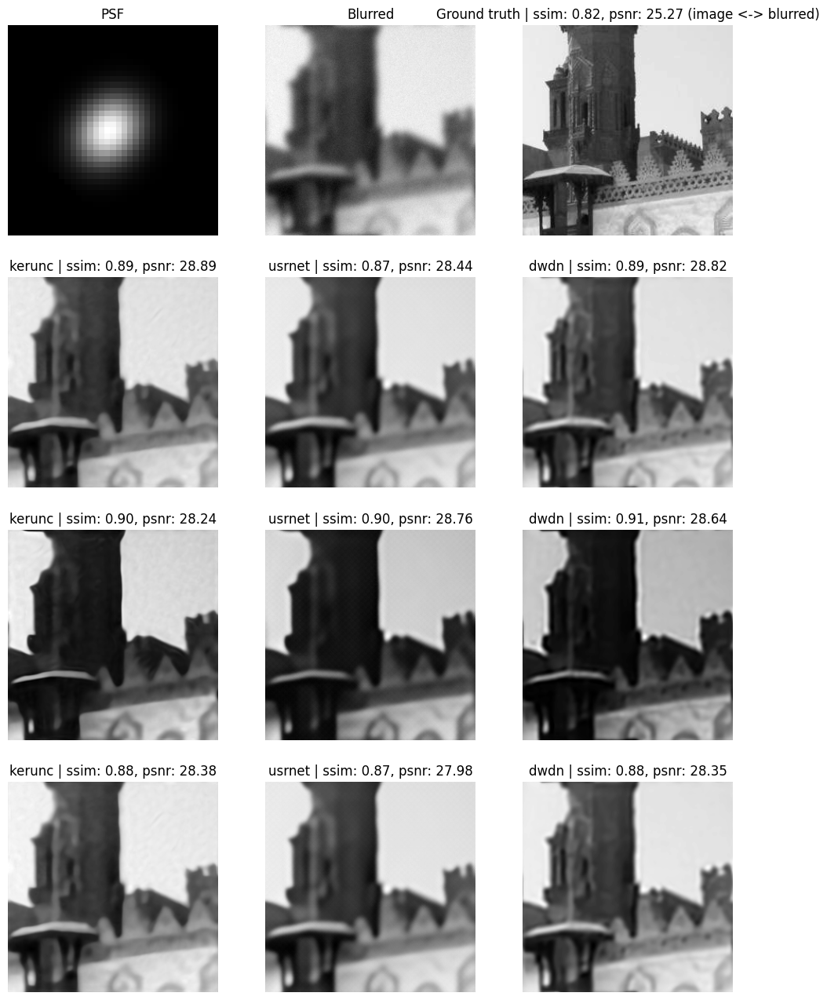

In [70]:
IS_NOISED = True

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-0.npy',
    is_noised=IS_NOISED,
)

viz_split_discretization(image, psf, blurred, blurred_3d, nn_models, is_noised=IS_NOISED, dicretization_types=['float', 'linrgb_16bit', 'srgb_8bit'])

## [+] №4 Виды размытия имеют разную "сложность"

Disclaimer: проверить это утверждение можно только на Винере

- motion blur `<` eye blur & gauss blur, где `<` означает проще
- однако это может быть связано с тем, что сила размытия у сгенерированных motion фильтров сильно ниже, чем у eye и gauss blur

#### Метрики

- без шума

In [7]:
%%sql sqlite://

SELECT blur_type, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_21_03_final 
WHERE model IN ('wiener_nonblind_noise') AND discretization == 'float' AND noised == False
GROUP BY model, blur_type;

Done.


blur_type,AVG(psnr),AVG(ssim)
eye_blur,35.91,0.98
gauss_blur,26.61,0.91
motion_blur,63.94,1.0


- с шумом

In [8]:
%%sql sqlite://

SELECT blur_type, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_21_03_final 
WHERE model IN ('wiener_nonblind_noise') AND discretization == 'float' AND noised == True
GROUP BY model, blur_type;

Done.


blur_type,AVG(psnr),AVG(ssim)
eye_blur,19.92,0.65
gauss_blur,22.02,0.76
motion_blur,25.58,0.87


#### Визуализация

In [9]:
wu_models = {key: value for key, value in models.items() if key in ['wiener', 'usrnet']}

1) Motion blur

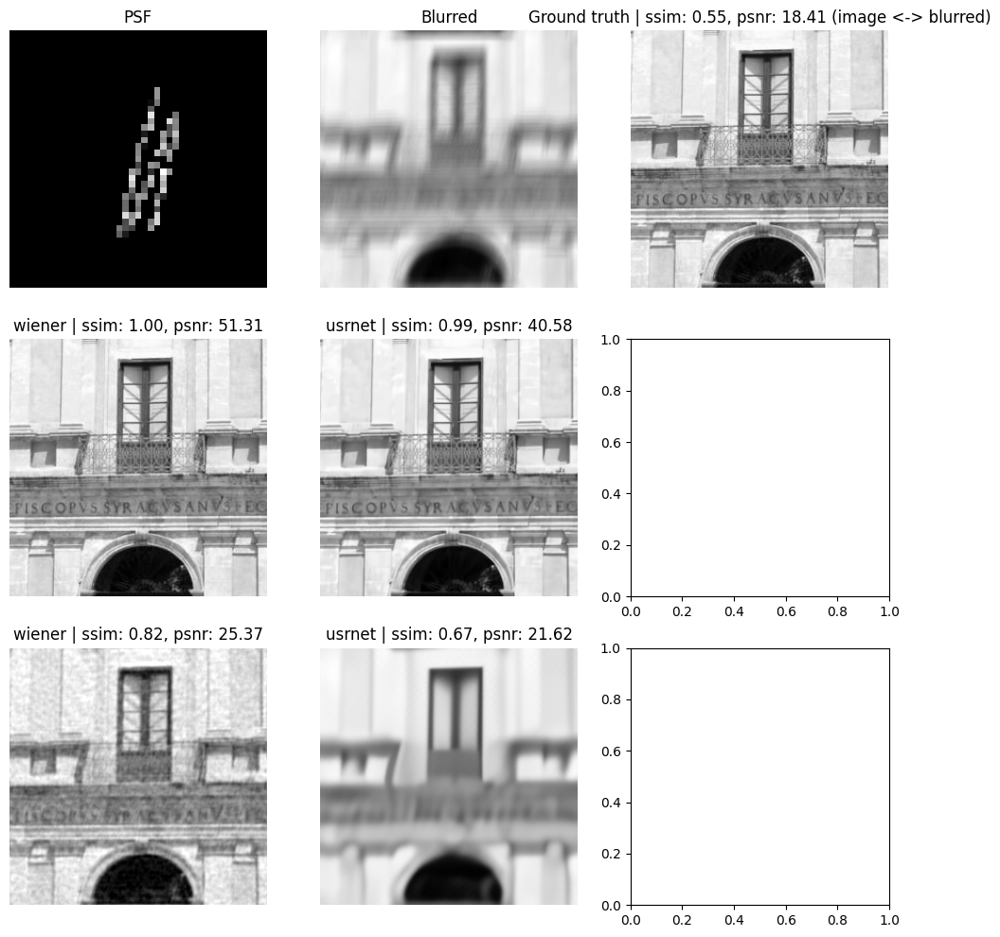

In [105]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-15.npy',
    is_noised=False,
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-15.npy',
    is_noised=True,
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, wu_models, discretization='float')

2. Gauss blur

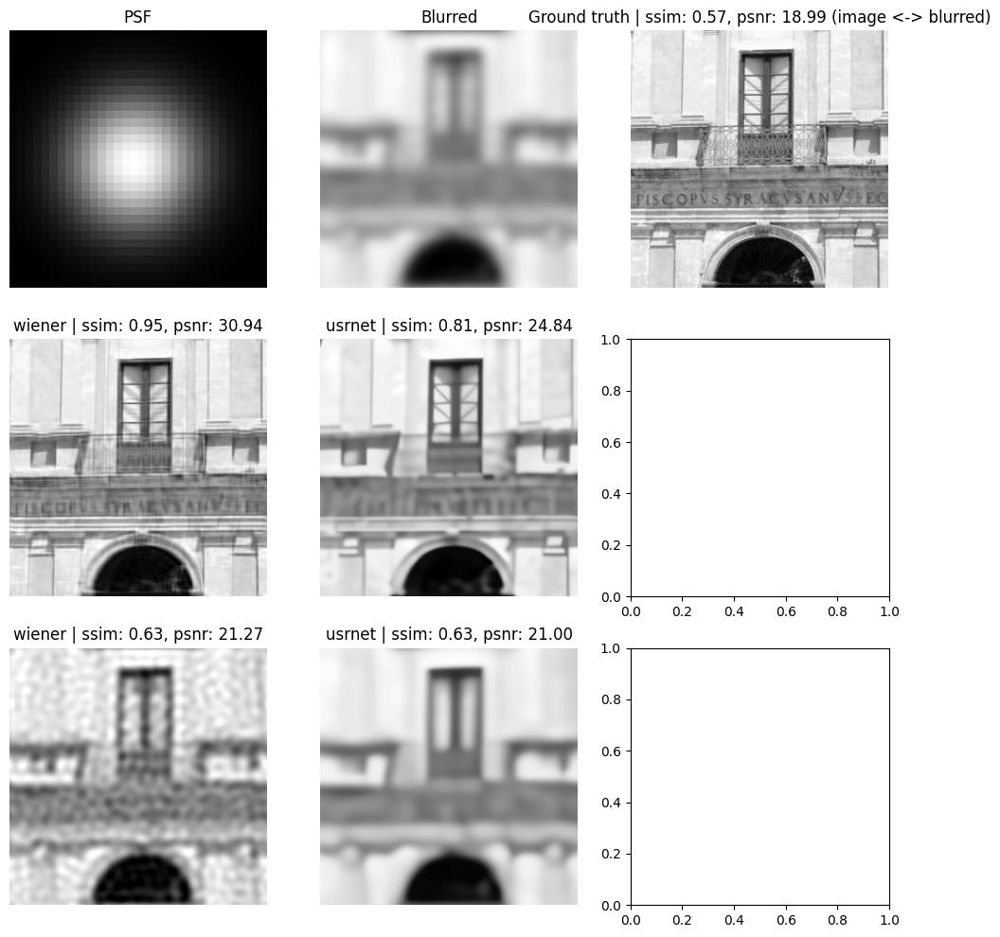

In [89]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-5.npy',
    is_noised=False,
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-5.npy',
    is_noised=True,
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, wu_models, discretization='float')

3. Eye blur: medium

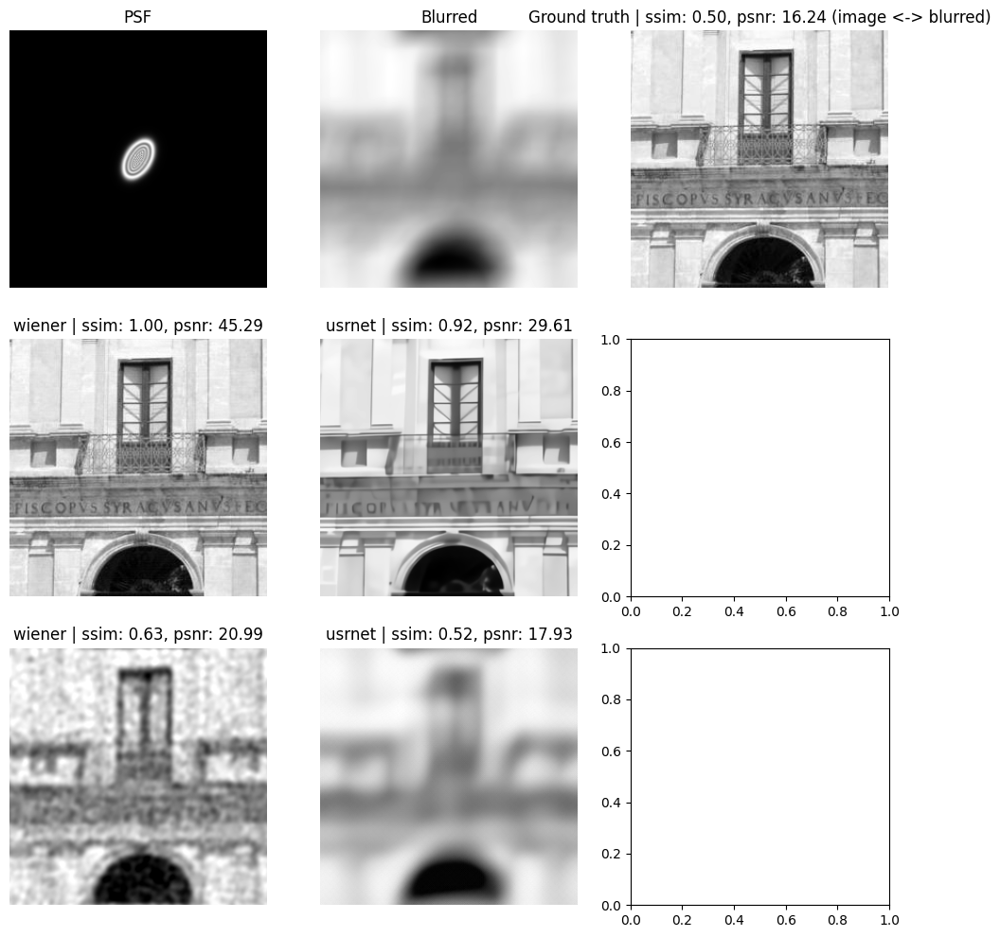

In [18]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/medium-psf-1.npy',
    is_noised=False,
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/medium-psf-1.npy',
    is_noised=True,
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, wu_models, discretization='float')

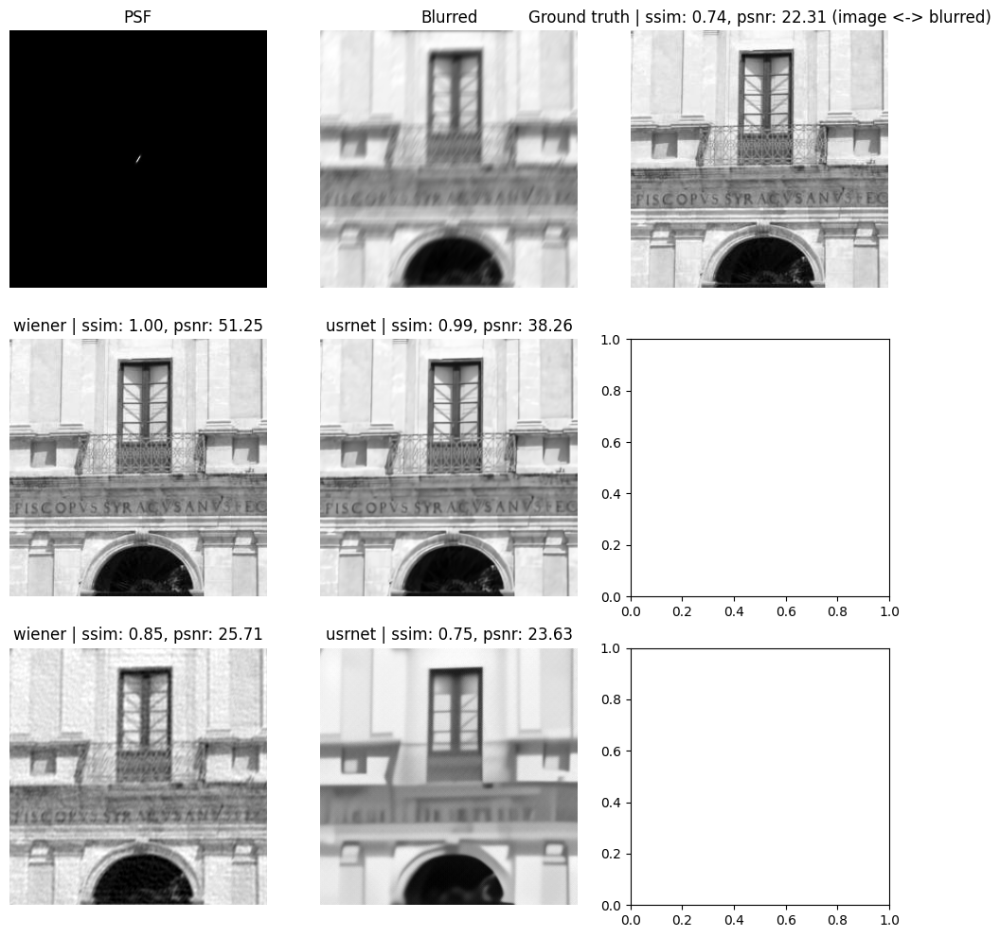

In [12]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/small-psf-1.npy',
    is_noised=False,
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/small-psf-1.npy',
    is_noised=True,
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, wu_models, discretization='float')

Eye blur: big

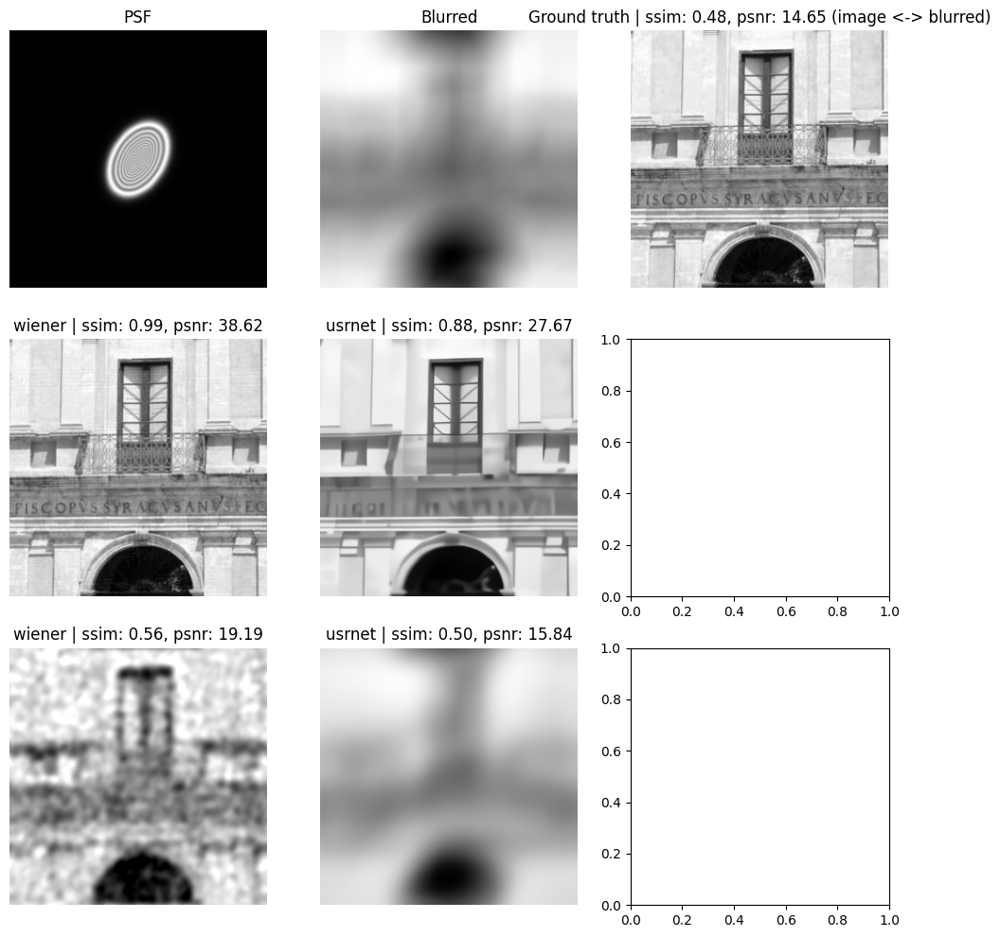

In [13]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/big-psf-1.npy',
    is_noised=False,
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/big-psf-1.npy',
    is_noised=True,
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, wu_models, discretization='float')

## №5 На качество восстановления влияет только тип размытия, но не тип GT изображения

#### Метрики

In [118]:
%%sql sqlite://


SELECT discretization, COUNT(discretization)
FROM full_test_21_03_final
GROUP BY discretization;

Done.


discretization,COUNT(discretization)
float,3320
linrgb_16bit,3320
srgb_8bit,13280


In [124]:
%%sql sqlite://

SELECT model, blur_type, image_dataset, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_21_03_final 
WHERE discretization in ('float', 'srgb_8bit') AND noised == False AND blur_type == 'motion_blur'
GROUP BY model, blur_type, image_dataset;

Done.


model,blur_type,image_dataset,AVG(psnr),AVG(ssim)
dwdn,motion_blur,bsds300,33.2,0.97
dwdn,motion_blur,precomp-animals,35.43,0.97
dwdn,motion_blur,precomp-city,33.85,0.97
dwdn,motion_blur,precomp-faces,35.31,0.97
dwdn,motion_blur,precomp-icons,33.18,0.99
dwdn,motion_blur,precomp-nature,35.34,0.97
dwdn,motion_blur,precomp-texts,32.84,0.98
dwdn,motion_blur,sun,33.54,0.97
kerunc,motion_blur,bsds300,33.66,0.96
kerunc,motion_blur,precomp-animals,36.16,0.97


#### Визуально

In [ ]:
## код для 1 утверждения: картинки

## №6 Дискретизация имеет разную сложность

Визуализация: зафиксировать ядро и изображение, менять дискретизацию

In [ ]:
## sql запрос и табличка

In [ ]:
## код для 1 утверждения: картинки

## №7 Робастность к ошибкам в ядре размытия

In [ ]:
## sql запрос и табличка

In [ ]:
## код для 1 утверждения: картинки

## №8 Проблемные примеры для Винера

#### Метрики

In [61]:
%%sql sqlite://

SELECT blur_type, image, kernel, psnr, ssim
FROM full_test_21_03_final 
WHERE model == 'wiener_nonblind_noise' AND discretization == 'float' AND noised == False AND ssim < 0.8
ORDER BY psnr, ssim
LIMIT 10;

Done.


blur_type,image,kernel,psnr,ssim
gauss_blur,datasets/gt/precomp/icons_jpg/3/ostrich.png,datasets/kernels/gauss-blur/processed/synthetic/synthetic-27.npy,19.57459065344422,0.7933752042237772
gauss_blur,datasets/gt/Sun-gray/im_31.png,datasets/kernels/gauss-blur/processed/synthetic/synthetic-2.npy,20.256126146191814,0.7571805207300186
gauss_blur,datasets/gt/Sun-gray/im_24.png,datasets/kernels/gauss-blur/processed/synthetic/synthetic-13.npy,23.61605706930426,0.7667518252581358
gauss_blur,datasets/gt/Sun-gray/im_32.png,datasets/kernels/gauss-blur/processed/synthetic/synthetic-12.npy,23.666406431816863,0.7893022215745449


#### Визуализации

№1

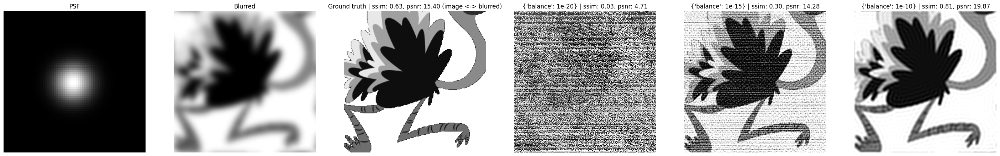

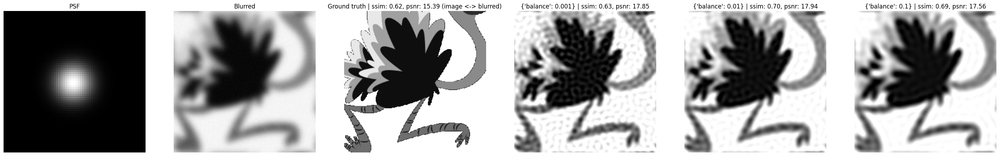

In [67]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/icons_jpg/3/ostrich.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-27.npy',
    is_noised=False,
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 1e-20}, {'balance': 1e-15}, {'balance': 1e-10}])


image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/icons_jpg/3/ostrich.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-27.npy',
    is_noised=True,
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 1e-3}, {'balance': 1e-2}, {'balance': 1e-1}])

№2

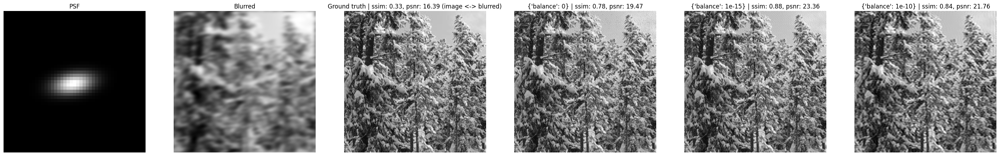

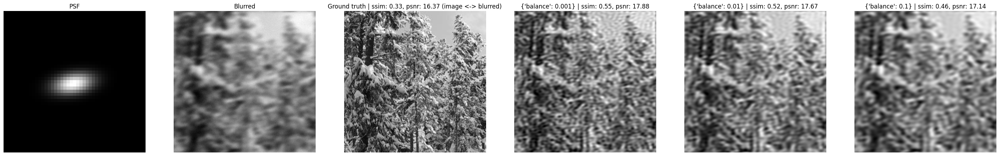

In [63]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_31.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-2.npy',
    is_noised=False,
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 0}, {'balance': 1e-15}, {'balance': 1e-10}])


image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_31.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-2.npy',
    is_noised=True,
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 1e-3}, {'balance': 1e-2}, {'balance': 1e-1}])

№3

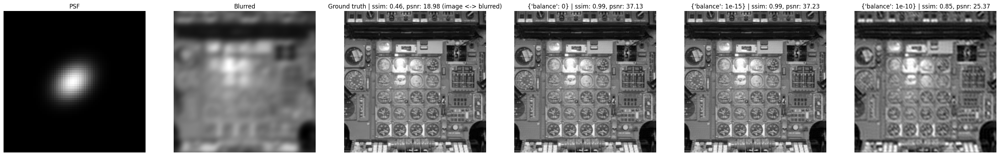

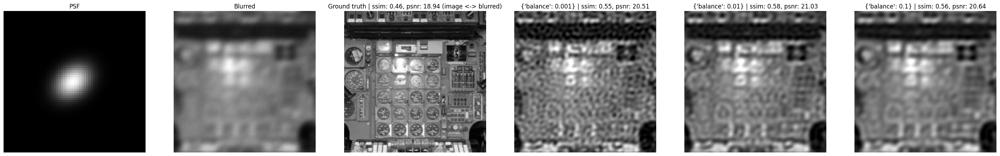

In [64]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_24.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-13.npy',
    is_noised=False,
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 0}, {'balance': 1e-15}, {'balance': 1e-10}])


image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_24.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-13.npy',
    is_noised=True,
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 1e-3}, {'balance': 1e-2}, {'balance': 1e-1}])

№4

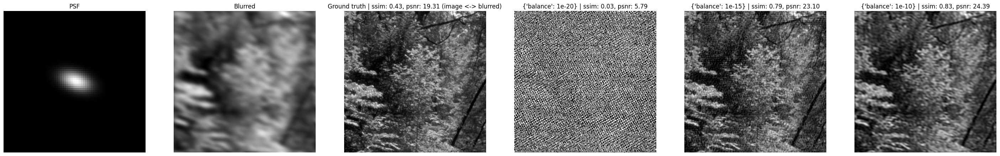

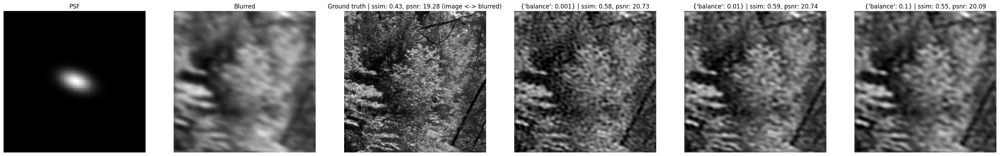

In [66]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_32.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-12.npy',
    is_noised=False,
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 1e-20}, {'balance': 1e-15}, {'balance': 1e-10}])


image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_32.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-12.npy',
    is_noised=True,
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 1e-3}, {'balance': 1e-2}, {'balance': 1e-1}])

№5 (не из таблицы)

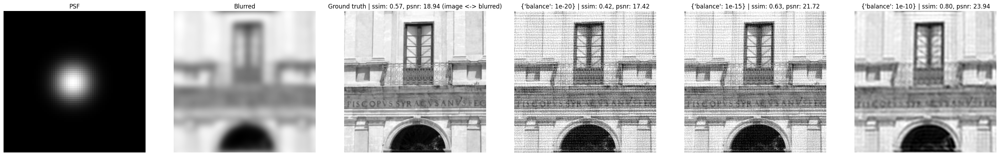

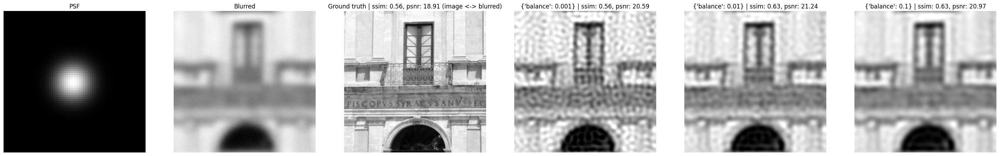

In [68]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-15.npy',
    is_noised=False,
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 1e-20}, {'balance': 1e-15}, {'balance': 1e-10}])


image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-15.npy',
    is_noised=True,
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 1e-3}, {'balance': 1e-2}, {'balance': 1e-1}])